In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
from scipy.stats import boxcox
import seaborn as sns
from ydata_profiling import ProfileReport

In [2]:
df = pd.read_csv("Houseprice.csv")
df.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
5,7237550310,20140512T000000,1225000.0,4,4.50,5420,101930,1.0,0,0,...,11,3890,1530,2001,0,98053,47.6561,-122.005,4760,101930
6,1321400060,20140627T000000,257500.0,3,2.25,1715,6819,2.0,0,0,...,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819
7,2008000270,20150115T000000,291850.0,3,1.50,1060,9711,1.0,0,0,...,7,1060,0,1963,0,98198,47.4095,-122.315,1650,9711
8,2414600126,20150415T000000,229500.0,3,1.00,1780,7470,1.0,0,0,...,7,1050,730,1960,0,98146,47.5123,-122.337,1780,8113
9,3793500160,20150312T000000,323000.0,3,2.50,1890,6560,2.0,0,0,...,7,1890,0,2003,0,98038,47.3684,-122.031,2390,7570


# About the dataset
A dataset about the houses in King County, Washington. Below's an explaination on vague features.
- sqft_living --> Interior space in Square foot (sqft_above + sqft_basement)
- sqft_lot --> The land space in Square foot.
- waterfront --> If the house's overlooking a waterfront or not.
- view --> (0 - 4) rating on how good the view is.
- condition --> (1 - 5) rating on the condition of the house.
- grade --> A grade on the building construction and desgin (11 - 13) indicate a high quality construction.
- sqft_above --> The Square foot of the interior housing space that is above ground level.
- sqft_basement --> The Square foot of the interior housing space that is below ground level.
- sqft_living15 --> The Square foot of interior housing living space for the nearest 15 neighbors.
- sqft_lot15 --> The Square foot of the land lots of the nearest 15 neighbors.

In [21]:
profile = ProfileReport(df, title = "Profile Report")
profile

Render HTML: 100%|██████████| 1/1 [00:13<00:00, 13.43s/it]


In [3]:
# Dropping the 'id' & 'date'
df.drop(['id', 'date'], inplace = True, axis = 1)

- According to the Profile report, there aren't any null nor duplicate values. However, we must check for null zero values as well.
- It wouldn't make sense for some features to have zeros as their entry, these are to be deemed as null values as well.

In [4]:
# Checking for zero values
feats = ['price', 'bedrooms', 'bathrooms','sqft_living','sqft_lot',	'floors','sqft_above', 'sqft_basement',	
         'yr_built', 'yr_renovated', 'zipcode',	'lat', 'long', 'sqft_living15',	'sqft_lot15']
# replacing zeros with null values
df[feats] = df[feats].replace(0 , np.nan)

In [5]:
df.isnull().sum()

price                0
bedrooms            13
bathrooms           10
sqft_living          0
sqft_lot             0
floors               0
waterfront           0
view                 0
condition            0
grade                0
sqft_above           0
sqft_basement    13126
yr_built             0
yr_renovated     20699
zipcode              0
lat                  0
long                 0
sqft_living15        0
sqft_lot15           0
dtype: int64

- The missing values in the 'bedrooms' and 'bathrooms' columns are to be imputed based on column distribution.
- The missing values in the 'sqft_basement' column might indicate that the house has a basement or not, it doesn't necessarily indicate missing values. --> convert to a binary column.
- Again, the missing values in the 'yr_renovated' column might indicate that the house was never renovated after it was first built. --> convert to a binary column.

In [6]:
# Converting 'sqft_basement' and 'yr-renovated' into binary columns
# null values = 0 / non-null values = 1
df['sqft_basement'] = df['sqft_basement'].notna().astype(int)
df['yr_renovated'] = df['yr_renovated'].notna().astype(int)

In [7]:
# Change the name of the columns
# Basement
df.rename(columns = {'sqft_basement': 'has_basement'}, inplace = True)
# Renovated
df.rename(columns = {'yr_renovated': 'is_renovated'}, inplace = True)

In [8]:
df.head(15)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,has_basement,yr_built,is_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3.0,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,538000.0,3.0,2.25,2570,7242,2.0,0,0,3,7,2170,1,1951,1,98125,47.7210,-122.319,1690,7639
2,180000.0,2.0,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,604000.0,4.0,3.00,1960,5000,1.0,0,0,5,7,1050,1,1965,0,98136,47.5208,-122.393,1360,5000
4,510000.0,3.0,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
5,1225000.0,4.0,4.50,5420,101930,1.0,0,0,3,11,3890,1,2001,0,98053,47.6561,-122.005,4760,101930
6,257500.0,3.0,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819
7,291850.0,3.0,1.50,1060,9711,1.0,0,0,3,7,1060,0,1963,0,98198,47.4095,-122.315,1650,9711
8,229500.0,3.0,1.00,1780,7470,1.0,0,0,3,7,1050,1,1960,0,98146,47.5123,-122.337,1780,8113
9,323000.0,3.0,2.50,1890,6560,2.0,0,0,3,7,1890,0,2003,0,98038,47.3684,-122.031,2390,7570


In [9]:
# Rounding entries in " bathrooms" & "floors" 
df['bathrooms'] = np.ceil(df['bathrooms'])
df['floors'] = np.ceil(df['floors'])

- Filling out the missing values in 'bedrooms' and 'bathrooms' based on distribution.

1. bathrooms


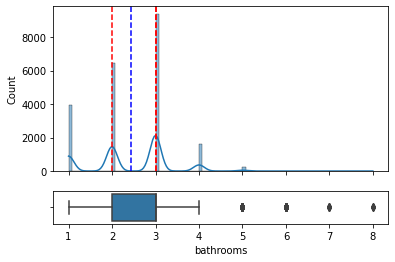

 
Data not skewed
 
Data normal
--------------------------------------------------
 
2. bedrooms


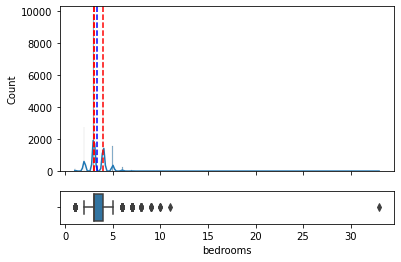

 
Data not skewed
 
Data normal
--------------------------------------------------
 


In [10]:
cols = ['bathrooms', 'bedrooms']
y = 1 # Keeping track of the num of loops

# List to store normally distributed columns
norm_data = [] 

# Loop through numerical columns
for x in cols:
    print(f'{y}. {x}')
    
    # Create subplots for histogram and box plot
    fig, ax = plt.subplots(2, 1, sharex = True, gridspec_kw = {'height_ratios':[5,1]})
    
    # Histogram with percentiles and mean lines
    sns.histplot(data = df, x = x, kde = True, ax = ax[0])
    ax[0].axvline(np.nanpercentile(df[x], 25), c='red', linestyle='--')
    ax[0].axvline(np.nanpercentile(df[x], 50), c='red', linestyle='--')
    ax[0].axvline(np.nanpercentile(df[x], 75), c='red', linestyle='--')
    ax[0].axvline(np.mean(df[x]), c = 'blue', linestyle = '--')
    
    # Box plot
    sns.boxplot(data = df, x = x, ax = ax[1])
    ax[1].set_xlabel(f'{x}')
    plt.show()
    
    # Skewness test
    print(' ')
    sk, pval = st.skewtest(df[x])
    if pval < 0.05:
        print(f'Data skewed with skew: {sk}')
    else:
        print(f'Data not skewed')
    
    # Normality test
    print(' ')
    norm, pval = st.normaltest(df[x])
    if pval < 0.05:
        print(f'Data not normal')
    else:
        print(f'Data normal')
        norm_data.append(x)
    
    print('-' * 50)
    print(' ')
    y += 1

- Since the data in both 'bedrooms' & 'bathrooms' adopts a normal distribution and isn't skewed, the missing values can be filled using the mean.

In [11]:
# Find the mean for 'bathrooms' and 'bedrooms' columns
mean_bathrooms = df['bathrooms'].mean()
mean_bedrooms = df['bedrooms'].mean()

# Fill the null values with the means
df['bathrooms'].fillna(mean_bathrooms, inplace = True)
df['bedrooms'].fillna(mean_bedrooms, inplace = True)


In [12]:
# Converting floats to ints
conv = ['bathrooms', 'bedrooms', 'floors']
df[conv] = df[conv].astype('int')

In [13]:
df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,has_basement,yr_built,is_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.400881e+05,3.372646,2.440198,2079.899736,1.510697e+04,1.542405,0.007542,0.234303,3.409430,7.656873,1788.390691,0.392680,1971.005136,0.042289,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,3.671272e+05,0.926423,0.922149,918.440897,4.142051e+04,0.567504,0.086517,0.766318,0.650743,1.175459,828.090978,0.488358,29.373411,0.201253,53.505026,0.138564,0.140828,685.391304,27304.179631
min,7.500000e+04,1.000000,1.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.219500e+05,3.000000,2.000000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,3.000000,1910.000000,7.618000e+03,2.000000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,3.000000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,4.000000,1.000000,4.000000,5.000000,13.000000,9410.000000,1.000000,2015.000000,1.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [14]:
# Max number of bedrooms
df[df['bedrooms'] == df['bedrooms'].max()]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,has_basement,yr_built,is_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,640000.0,33,2,1620,6000,1,0,0,5,7,1040,1,1947,0,98103,47.6878,-122.331,1330,4700


- As shown in the table, it wouldn't make sense to have 33 bedrooms, makes you think that it might be a typo.

In [15]:
# Replacing the entry = 33 with 3
df['bedrooms'] = df['bedrooms'].replace(33, 3)

# Statistical Analysis (Continuous Data)

In [17]:
# Univariate Statistical Analysis
# Function for outlier detection
def outlier(x):  # Calculating Quartiles
    q1 = np.nanpercentile(x, 25)
    q3 = np.nanpercentile(x, 75)
    iqr = q3 - q1  # Calculating the IQR
    lower_fence = q1 - 1.5 * iqr # Calculating the lower fence 
    upper_fence = q3 + 1.5 * iqr # Calculating the upper fence
    

    non_outlier = []  # If datapoint falls within the upper and lower fence its considered a non_outlier
    for num in x:
        if num >= lower_fence and num <= upper_fence:
            non_outlier.append(num)
    lower_whisker = np.min(non_outlier) # The lower and upper whiskers are calculated as the minimum and maximum values within the non_outlier list, respectively.
    upper_whisker = np.max(non_outlier)
    
    
    outlier = [] # If datapoint doesn't fall within the upper and lower fence its considered an outlier
    for num in x:
        if num < lower_fence or num > upper_fence:
            outlier.append(num)
    
    outlier_count = len(outlier)
    
    print('lower_whisker: {}'.format(lower_whisker))
    print('upper_whisker: {}'.format(upper_whisker))
    print('outlier counts: {}'.format(outlier_count))

1. sqft_living


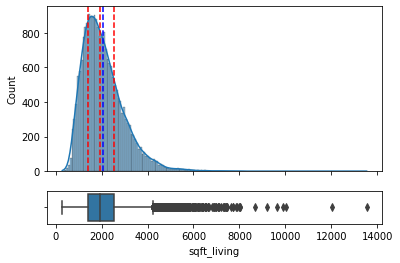

 
count    21613.000000
mean      2079.899736
std        918.440897
min        290.000000
25%       1427.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: sqft_living, dtype: float64
 
lower_whisker: 290
upper_whisker: 4230
outlier counts: 572
 
Data skewed with skew: 66.26411115863115
 
Data not normal
--------------------------------------------------
 
2. sqft_lot


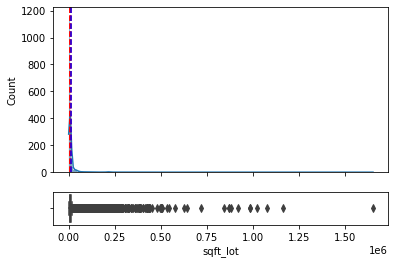

 
count    2.161300e+04
mean     1.510697e+04
std      4.142051e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.618000e+03
75%      1.068800e+04
max      1.651359e+06
Name: sqft_lot, dtype: float64
 
lower_whisker: 520
upper_whisker: 19141
outlier counts: 2425
 
Data skewed with skew: 169.9883312911466
 
Data not normal
--------------------------------------------------
 
3. sqft_above


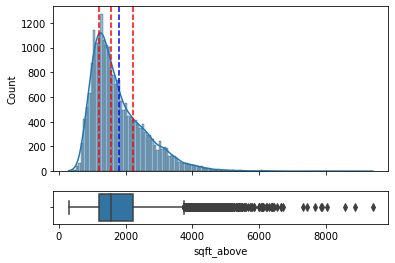

 
count    21613.000000
mean      1788.390691
std        828.090978
min        290.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: sqft_above, dtype: float64
 
lower_whisker: 290
upper_whisker: 3740
outlier counts: 611
 
Data skewed with skew: 65.53405622531963
 
Data not normal
--------------------------------------------------
 
4. yr_built


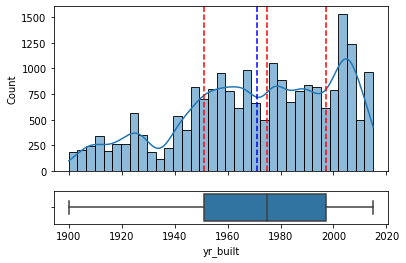

 
count    21613.000000
mean      1971.005136
std         29.373411
min       1900.000000
25%       1951.000000
50%       1975.000000
75%       1997.000000
max       2015.000000
Name: yr_built, dtype: float64
 
lower_whisker: 1900
upper_whisker: 2015
outlier counts: 0
 
Data skewed with skew: -26.844192863095948
 
Data not normal
--------------------------------------------------
 
5. zipcode


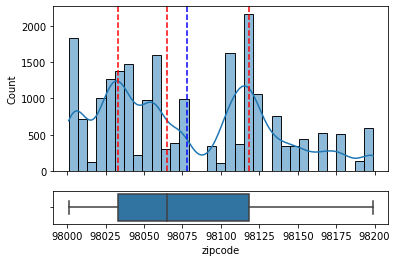

 
count    21613.000000
mean     98077.939805
std         53.505026
min      98001.000000
25%      98033.000000
50%      98065.000000
75%      98118.000000
max      98199.000000
Name: zipcode, dtype: float64
 
lower_whisker: 98001
upper_whisker: 98199
outlier counts: 0
 
Data skewed with skew: 23.45006114511559
 
Data not normal
--------------------------------------------------
 
6. lat


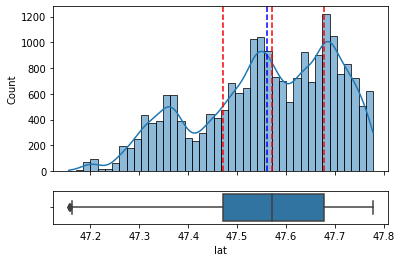

 
count    21613.000000
mean        47.560053
std          0.138564
min         47.155900
25%         47.471000
50%         47.571800
75%         47.678000
max         47.777600
Name: lat, dtype: float64
 
lower_whisker: 47.1622
upper_whisker: 47.7776
outlier counts: 2
 
Data skewed with skew: -27.645745340055704
 
Data not normal
--------------------------------------------------
 
7. long


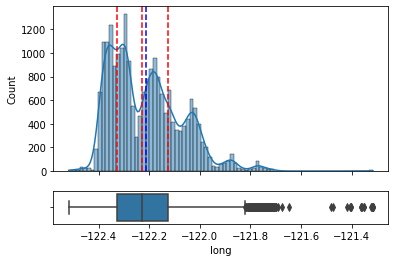

 
count    21613.000000
mean      -122.213896
std          0.140828
min       -122.519000
25%       -122.328000
50%       -122.230000
75%       -122.125000
max       -121.315000
Name: long, dtype: float64
 
lower_whisker: -122.519
upper_whisker: -121.821
outlier counts: 256
 
Data skewed with skew: 46.05926284362536
 
Data not normal
--------------------------------------------------
 
8. sqft_living15


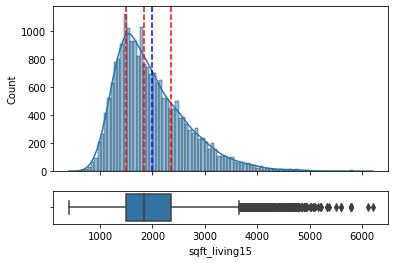

 
count    21613.000000
mean      1986.552492
std        685.391304
min        399.000000
25%       1490.000000
50%       1840.000000
75%       2360.000000
max       6210.000000
Name: sqft_living15, dtype: float64
 
lower_whisker: 399
upper_whisker: 3660
outlier counts: 544
 
Data skewed with skew: 54.55989344633475
 
Data not normal
--------------------------------------------------
 
9. sqft_lot15


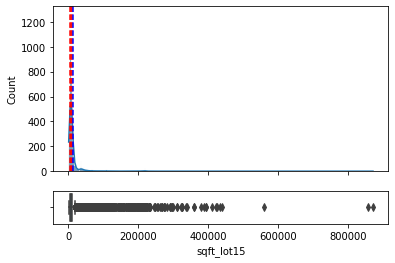

 
count     21613.000000
mean      12768.455652
std       27304.179631
min         651.000000
25%        5100.000000
50%        7620.000000
75%       10083.000000
max      871200.000000
Name: sqft_lot15, dtype: float64
 
lower_whisker: 651
upper_whisker: 17550
outlier counts: 2194
 
Data skewed with skew: 154.45562936859645
 
Data not normal
--------------------------------------------------
 


In [18]:
# Univariate Analysis
# Finding the count, mean, std, min, Q1, Q2, Q3, max for each column. In addition to finding the outlier counts in each column, how much the data is skewed-
# and if the data adopts a normal distribution or not.

cols = ['sqft_living',	'sqft_lot', 'sqft_above',
         'yr_built', 'zipcode',	'lat', 'long', 'sqft_living15',	'sqft_lot15']
y = 1 # Keeping track of the num of loops
# List to store normally distributed columns
norm_data = [] 

# Loop through numerical columns
for x in cols:
    print(f'{y}. {x}')
    
    # Create subplots for histogram and box plot
    fig, ax = plt.subplots(2, 1, sharex = True, gridspec_kw = {'height_ratios':[5,1]})
    
    # Histogram with percentiles and mean lines
    sns.histplot(data = df, x = x, kde = True, ax = ax[0])
    ax[0].axvline(np.nanpercentile(df[x], 25), c='red', linestyle='--')
    ax[0].axvline(np.nanpercentile(df[x], 50), c='red', linestyle='--')
    ax[0].axvline(np.nanpercentile(df[x], 75), c='red', linestyle='--')
    ax[0].axvline(np.mean(df[x]), c = 'blue', linestyle = '--')
    
    # Box plot
    sns.boxplot(data = df, x = x, ax = ax[1])
    ax[1].set_xlabel(f'{x}')
    plt.show()
    
    # Print summary statistics
    print(' ')
    print(df[x].describe())
    
    # Outlier detection
    print(' ')
    outlier(df[x])
    
    # Skewness test
    print(' ')
    sk, pval = st.skewtest(df[x])
    if pval < 0.05:
        print(f'Data skewed with skew: {sk}')
    else:
        print(f'Data not skewed')
    
    # Normality test
    print(' ')
    norm, pval = st.normaltest(df[x])
    if pval < 0.05:
        print(f'Data not normal')
    else:
        print(f'Data normal')
        norm_data.append(x)
    
    print('-' * 50)
    print(' ')
    y += 1

# Addressing Outliers

- 1- For the 'lat', 'long' and 'zipcode' columns no action is to be taken since outliers can be meaningful in the context of the column.
- 3 - The 'yr_built' column doesn't seem to be having any outliers.
- 2- For the remaining columns ['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_living15', 'sqft_lot15'] --> Winsorization. It's when the values that are greater/lower than the upper/lower whiskers, they're replaced with the lower/upper whiskers value.

In [19]:
# sqft_living
upper_whisker = 4230 
lower_whisker = 290   

# Winsorize 'sqft_living'
df['sqft_living'] = np.where(df['sqft_living'] > upper_whisker, upper_whisker, df['sqft_living'])
df['sqft_living'] = np.where(df['sqft_living'] < lower_whisker, lower_whisker, df['sqft_living'])

In [20]:
# sqft_lot
upper_whisker = 19141
lower_whisker = 520  

# Winsorize 'sqft_lot'
df['sqft_lot'] = np.where(df['sqft_lot'] > upper_whisker, upper_whisker, df['sqft_lot'])
df['sqft_lot'] = np.where(df['sqft_lot'] < lower_whisker, lower_whisker, df['sqft_lot'])

In [21]:
# sqft_above
upper_whisker = 3740
lower_whisker = 290  

# Winsorize 'sqft_above'
df['sqft_above'] = np.where(df['sqft_above'] > upper_whisker, upper_whisker, df['sqft_above'])
df['sqft_above'] = np.where(df['sqft_above'] < lower_whisker, lower_whisker, df['sqft_above'])

In [22]:
# sqft_living15
upper_whisker = 3660 
lower_whisker = 399   

# Winsorize 'sqft_living15'
df['sqft_living15'] = np.where(df['sqft_living15'] > upper_whisker, upper_whisker, df['sqft_living15'])
df['sqft_living15'] = np.where(df['sqft_living15'] < lower_whisker, lower_whisker, df['sqft_living15'])

In [23]:
# sqft_lot15
upper_whisker = 17550
lower_whisker = 651  

# Winsorize 'sqft_lot15'
df['sqft_lot15'] = np.where(df['sqft_lot15'] > upper_whisker, upper_whisker, df['sqft_lot15'])
df['sqft_lot15'] = np.where(df['sqft_lot15'] < lower_whisker, lower_whisker, df['sqft_lot15'])

- Re-checking for Outliers

In [24]:
cols = ['sqft_living',	'sqft_lot', 'sqft_above', 'sqft_living15',	'sqft_lot15']
y = 1 # Keeping track of the num of loops
# List to store normally distributed columns
norm_data = [] 

# Loop through numerical columns
for x in cols:
    print(f'{y}. {x}')
    
    # Outlier detection
    print(' ')
    outlier(df[x])
    
    # Skewness test
    print(' ')
    sk, pval = st.skewtest(df[x])
    if pval < 0.05:
        print(f'Data skewed with skew: {sk}')
    else:
        print(f'Data not skewed')
    
    # Normality test
    print(' ')
    norm, pval = st.normaltest(df[x])
    if pval < 0.05:
        print(f'Data not normal')
    else:
        print(f'Data normal')
        norm_data.append(x)
    
    print('-' * 50)
    print(' ')
    y += 1

1. sqft_living
 
lower_whisker: 290
upper_whisker: 4230
outlier counts: 0
 
Data skewed with skew: 39.330418794116305
 
Data not normal
--------------------------------------------------
 
2. sqft_lot
 
lower_whisker: 520
upper_whisker: 19141
outlier counts: 0
 
Data skewed with skew: 43.78582719051959
 
Data not normal
--------------------------------------------------
 
3. sqft_above
 
lower_whisker: 290
upper_whisker: 3740
outlier counts: 0
 
Data skewed with skew: 46.88404010374833
 
Data not normal
--------------------------------------------------
 
4. sqft_living15
 
lower_whisker: 399
upper_whisker: 3660
outlier counts: 0
 
Data skewed with skew: 41.29060024654864
 
Data not normal
--------------------------------------------------
 
5. sqft_lot15
 
lower_whisker: 651
upper_whisker: 17550
outlier counts: 0
 
Data skewed with skew: 41.08419475848595
 
Data not normal
--------------------------------------------------
 


# Addressing Skewness

In [26]:
cols = ['sqft_living',	'sqft_lot', 'sqft_above', 'sqft_living15',	'sqft_lot15']

# Loop through the columns and apply Box-Cox transformation
for col in cols:
    df[col], _ = boxcox(df[col])

In [27]:
# Checking if the issue is addressed.
cols = ['sqft_living',	'sqft_lot', 'sqft_above', 'sqft_living15',	'sqft_lot15']
y = 1 # Keeping track of the num of loops
# List to store normally distributed columns
norm_data = [] 

# Loop through numerical columns
for x in cols:
    print(f'{y}. {x}')
    
    # Skewness test
    print(' ')
    sk, pval = st.skewtest(df[x])
    if pval < 0.05:
        print(f'Data skewed with skew: {sk}')
    else:
        print(f'Data not skewed')
    
    # Normality test
    print(' ')
    norm, pval = st.normaltest(df[x])
    if pval < 0.05:
        print(f'Data not normal')
    else:
        print(f'Data normal')
        norm_data.append(x)
    
    print('-' * 50)
    print(' ')
    y += 1

1. sqft_living
 
Data not skewed
 
Data not normal
--------------------------------------------------
 
2. sqft_lot
 
Data not skewed
 
Data not normal
--------------------------------------------------
 
3. sqft_above
 
Data not skewed
 
Data not normal
--------------------------------------------------
 
4. sqft_living15
 
Data not skewed
 
Data not normal
--------------------------------------------------
 
5. sqft_lot15
 
Data not skewed
 
Data not normal
--------------------------------------------------
 


In [ ]:
df.to_csv("After_Modifications.csv", index = False)